In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [42]:
df = pd.read_csv("real_estate.txt", 
                 names=["id","date","bedrooms","bathrooms","sqft_living","sqft_lot","floors",
                        "waterfront","view","condition","grade","sqft_above","sqft_basement","yr_built", 
                        "yr_renovated","zipcode","lat","long","sqft_living15","sqft_lot15","price"])

In [43]:
df.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,10/13/14,3,1.00,1180,5650,1.0,0,0,3,...,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,12/9/14,3,2.25,2570,7242,2.0,0,0,3,...,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,2/25/15,2,1.00,770,10000,1.0,0,0,3,...,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,12/9/14,4,3.00,1960,5000,1.0,0,0,5,...,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,2/18/15,3,2.00,1680,8080,1.0,0,0,3,...,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     21597 non-null  int64  
 8   view           21597 non-null  int64  
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  int64  
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  int64  
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

# Basic data cleaning for SQL & Tableau

In [45]:
df[['bathrooms', 'floors']] = df[['bathrooms', 'floors']].apply(np.ceil).astype(int)
df['date'] = pd.to_datetime(df['date'], format="%m/%d/%y")
df['date'] = df['date'].dt.strftime('%d/%m/%Y')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  int64  
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  int64  
 7   waterfront     21597 non-null  int64  
 8   view           21597 non-null  int64  
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  int64  
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  int64  
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [46]:
col_names = {'date': 'date_sold', 'sqft_living': 'm2_living',
             'sqft_lot': 'm2_total', 'sqft_above': 'm2_above',
            'sqft_basement': 'm2_basement', 'sqft_living15': 'm2_living15', 'sqft_lot15': 'm2_total15'}
df = df.rename(columns=col_names)
df.head()

,id,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,...,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
0,7129300520,13/10/2014,3,1,1180,5650,1,0,0,3,...,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,09/12/2014,3,3,2570,7242,2,0,0,3,...,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,25/02/2015,2,1,770,10000,1,0,0,3,...,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,09/12/2014,4,3,1960,5000,1,0,0,5,...,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,18/02/2015,3,2,1680,8080,1,0,0,3,...,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


In [47]:
# sqft to m2

df[['m2_living', 'm2_total', 'm2_above', 'm2_basement', 'm2_living15', 'm2_total15']] = round(df[['m2_living', 'm2_total', 'm2_above', 'm2_basement', 'm2_living15', 'm2_total15']] / 10.764, 2)


In [48]:
df.head()

,id,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,...,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
0,7129300520,13/10/2014,3,1,109.62,524.90,1,0,0,3,...,109.62,0.00,1955,0,98178,47.5112,-122.257,124.49,524.90,221900
1,6414100192,09/12/2014,3,3,238.76,672.80,2,0,0,3,...,201.60,37.16,1951,1991,98125,47.7210,-122.319,157.00,709.68,538000
2,5631500400,25/02/2015,2,1,71.53,929.02,1,0,0,3,...,71.53,0.00,1933,0,98028,47.7379,-122.233,252.69,748.98,180000
3,2487200875,09/12/2014,4,3,182.09,464.51,1,0,0,5,...,97.55,84.54,1965,0,98136,47.5208,-122.393,126.35,464.51,604000
4,1954400510,18/02/2015,3,2,156.08,750.65,1,0,0,3,...,156.08,0.00,1987,0,98074,47.6168,-122.045,167.22,697.05,510000


In [41]:
df.loc[df['yr_renovated'] == 0]

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,13/10/2014,3,1,1180,5650,1,0,0,3,...,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
2,5631500400,25/02/2015,2,1,770,10000,1,0,0,3,...,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,09/12/2014,4,3,1960,5000,1,0,0,5,...,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,18/02/2015,3,2,1680,8080,1,0,0,3,...,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000
5,7237550310,12/05/2014,4,5,5420,101930,1,0,0,3,...,3890,1530,2001,0,98053,47.6561,-122.005,4760,101930,1230000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,21/05/2014,3,3,1530,1131,3,0,0,3,...,1530,0,2009,0,98103,47.6993,-122.346,1530,1509,360000
21593,6600060120,23/02/2015,4,3,2310,5813,2,0,0,3,...,2310,0,2014,0,98146,47.5107,-122.362,1830,7200,400000
21594,1523300141,23/06/2014,2,1,1020,1350,2,0,0,3,...,1020,0,2009,0,98144,47.5944,-122.299,1020,2007,402101
21595,291310100,16/01/2015,3,3,1600,2388,2,0,0,3,...,1600,0,2004,0,98027,47.5345,-122.069,1410,1287,400000


In [49]:
df.to_csv(r'clean_data.csv', index = None, header=True)

In [50]:
df.head()

,id,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,...,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
0,7129300520,13/10/2014,3,1,109.62,524.90,1,0,0,3,...,109.62,0.00,1955,0,98178,47.5112,-122.257,124.49,524.90,221900
1,6414100192,09/12/2014,3,3,238.76,672.80,2,0,0,3,...,201.60,37.16,1951,1991,98125,47.7210,-122.319,157.00,709.68,538000
2,5631500400,25/02/2015,2,1,71.53,929.02,1,0,0,3,...,71.53,0.00,1933,0,98028,47.7379,-122.233,252.69,748.98,180000
3,2487200875,09/12/2014,4,3,182.09,464.51,1,0,0,5,...,97.55,84.54,1965,0,98136,47.5208,-122.393,126.35,464.51,604000
4,1954400510,18/02/2015,3,2,156.08,750.65,1,0,0,3,...,156.08,0.00,1987,0,98074,47.6168,-122.045,167.22,697.05,510000


# Dropping column ID & meaningful names

In [17]:
df.drop('id', axis=1, inplace=True)

In [18]:
df['yr_renovated'].value_counts()

0       20683
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [19]:
col_names = {'date': 'date_sold', 'sqft_living': 'm2_living',
             'sqft_lot': 'm2_total', 'sqft_above': 'm2_above',
            'sqft_basement': 'm2_basement', 'sqft_living15': 'm2_living15', 'sqft_lot15': 'm2_total15'}
df = df.rename(columns=col_names)
df.head()

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
0,10/13/14,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,12/9/14,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,2/25/15,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,12/9/14,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,2/18/15,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


In [20]:
# sqft to m2

df[['m2_living', 'm2_total', 'm2_above', 'm2_basement', 'm2_living15', 'm2_total15']] = round(df[['m2_living', 'm2_total', 'm2_above', 'm2_basement', 'm2_living15', 'm2_total15']] / 10.764, 2)


In [21]:
df.head()

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
0,10/13/14,3,1.00,109.62,524.90,1.0,0,0,3,7,109.62,0.00,1955,0,98178,47.5112,-122.257,124.49,524.90,221900
1,12/9/14,3,2.25,238.76,672.80,2.0,0,0,3,7,201.60,37.16,1951,1991,98125,47.7210,-122.319,157.00,709.68,538000
2,2/25/15,2,1.00,71.53,929.02,1.0,0,0,3,6,71.53,0.00,1933,0,98028,47.7379,-122.233,252.69,748.98,180000
3,12/9/14,4,3.00,182.09,464.51,1.0,0,0,5,7,97.55,84.54,1965,0,98136,47.5208,-122.393,126.35,464.51,604000
4,2/18/15,3,2.00,156.08,750.65,1.0,0,0,3,8,156.08,0.00,1987,0,98074,47.6168,-122.045,167.22,697.05,510000


# Focusing on price

In [22]:
df['price'].describe()

count    2.159700e+04
mean     5.402966e+05
std      3.673681e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

In [25]:
profile = df.profile_report(title="EDA")

In [26]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

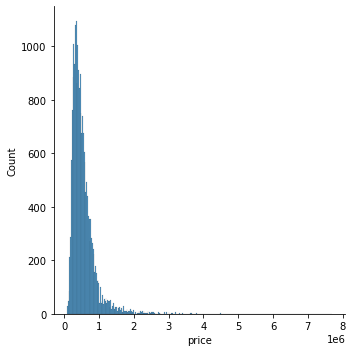

In [69]:
sns.displot(df['price'])